## Relativistic Aberration of light 


In [170]:
from manim import * 
import numpy as np 
from scipy.constants import c 

Manim Community v0.17.3

### Functions for relativistic doppler shift and aberration

In [261]:
def transform_theta_obs(theta, velocity, light = c):
    '''
    Transforms the phi angle POV
    '''
    beta = velocity / light
    gamma = 1 / np.sqrt(1-beta**2)
    numer = np.sin(theta)
    denom = gamma * (np.cos(theta) + beta)
    theta_p = np.arctan(numer / denom)
    return theta_phi

def light_aberration(theta, velocity, light = c):
    beta = velocity / light 
    numer = np.cos(theta) - beta 
    denom = 1 - beta*np.cos(theta) 
    theta_p = np.arccos(numer/denom) 
    return theta_p

def doppler_shift(wavelength, initial_angle , velocity, light =c):
    beta = velocity / light 
    gamma = 1 / np.sqrt(1-beta**2)
    D = 1 / (gamma * (1 - beta * np.cos(initial_angle))) 
    wave_  = wavelength * D
    return wave_

def convert_to_temp(wavelength, b=2.898e6):
    '''
    Wavelength is in nanometers ! 
    '''
    temp = b / wavelength
    return temp

def rgb_to_hex(rgb):
    return '#{:02X}{:02X}{:02X}'.format(int(rgb[0]), int(rgb[1]), int(rgb[2]))


### Functions for doppler shift 

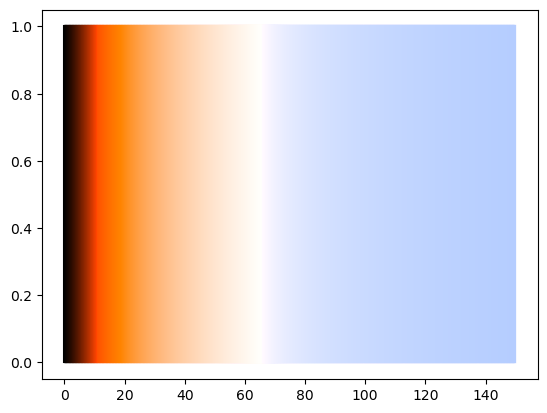

In [43]:
import math
def convert_K_to_RGB(colour_temperature):
    """
    Converts from K to RGB, algorithm courtesy of 
    http://www.tannerhelland.com/4435/convert-temperature-rgb-algorithm-code/
    """
    if colour_temperature <= 1100.0:
        red, green, blue = 255, 67.92041905680745, 0
        red = red * math.pow(colour_temperature / 1100.0, 1.25)
        green = green * math.pow(colour_temperature / 1100.0, 1.25)
        return red, green, blue
    
    # red 
    else:
        #range check
        if colour_temperature < 1000: 
            colour_temperature = 1000
        if colour_temperature > 40000:
            colour_temperature = 40000
        tmp_internal = colour_temperature / 100.0
        if tmp_internal <= 66:
            red = 255
        else:
            tmp_red = 329.698727446 * math.pow(tmp_internal - 60, -0.1332047592)
            if tmp_red < 0:
                red = 0
            elif tmp_red > 255:
                red = 255
            else:
                red = tmp_red

        # green
        if tmp_internal <=66:
            tmp_green = 99.4708025861 * math.log(tmp_internal) - 161.1195681661
            if tmp_green < 0:
                green = 0
            elif tmp_green > 255:
                green = 255
            else:
                green = tmp_green
        else:
            tmp_green = 288.1221695283 * math.pow(tmp_internal - 60, -0.0755148492)
            if tmp_green < 0:
                green = 0
            elif tmp_green > 255:
                green = 255
            else:
                green = tmp_green

        # blue
        if tmp_internal >=66:
            blue = 255
        elif tmp_internal <= 19:
            blue = 0
        else:
            tmp_blue = 138.5177312231 * math.log(tmp_internal - 10) - 305.0447927307
            if tmp_blue < 0:
                blue = 0
            elif tmp_blue > 255:
                blue = 255
            else:
                blue = tmp_blue 


        return red, green, blue

    
import matplotlib.pyplot as plt 
step_size = 10
for i in range(0, 15000, step_size):
    color_temperature = i  # Update color temperature for each iteration
    color = list(map(lambda div: div / 255.0, convert_K_to_RGB(color_temperature))) + [1]
    plt.plot((abs(i) / 100, abs(i) / 100), (0, 1),  linestyle="-", color=color)
plt.show()


## Manim code 

In [ ]:
%%manim -qh Aberration_Doppler

class Aberration_Doppler(Scene):
    def construct(self):
        # Define initial angles for 12 arrows distributed symmetrically
        frac = 11/12
        initial_angles = np.linspace(-frac * np.pi,  frac * np.pi, 10, endpoint=True)
        
        rest_wavelength = 1080 # 1080 nanometers
        temp = convert_to_temp(rest_wavelength)
        red, green, blue = convert_K_to_RGB(temp)
        colour = rgb_to_hex([int(red), int(green), int(blue)])

        # Create arrows at the initial angles
        arrows = VGroup()
        
        for angle in initial_angles:
            arrow = Arrow(start=2 * np.array([np.cos(angle), np.sin(angle), 0]), end=ORIGIN, color=colour, tip_length = 0.2)
            arrows.add(arrow)
        
        arrows.shift(DOWN * 1) 
        
        ## Create the Tex data for the text
        # Create the Tex data for the initial text
        tex = Tex('Relativistic aberration and doppler shift').shift(UP * 2.25)
        text = MathTex(r"v/c = 0.00").shift(UP * 1.5)
        
        self.play(FadeIn(arrows), FadeIn(text, tex))
        self.wait(1)
        
        
        velocities = [-0.5, -0.8, -0.9, -0.99, -0.998 , 0]  # 10 different velocities from 0.0 to 0.999 * c
        
        inner_runtime = 2.0
        
        for v in velocities:
            transformed_arrows = VGroup()
            for angle in initial_angles:
                transformed_angle = light_aberration(angle, v * c)
                shifted_wavelength = doppler_shift(rest_wavelength, angle, v * c)
                temp = convert_to_temp(shifted_wavelength)
                red, green, blue = convert_K_to_RGB(temp)
                Colour = rgb_to_hex([int(red), int(green), int(blue)])
                if angle < 0: 
                    transformed_angle = - transformed_angle
                
                transformed_arrow = Arrow(start=2 * np.array([np.cos(transformed_angle), np.sin(transformed_angle), 0]), end=ORIGIN, 
                                          color=Colour, tip_length=0.2).shift(DOWN * 1) 
                transformed_arrows.add(transformed_arrow)
            
            # Update text for current velocity
            v = np.abs(v) 
            new_text = MathTex(rf"v/c = {v:.3f}").shift(UP * 1.5)
            
            # Update arrows and text
            self.play(Transform(arrows, transformed_arrows, run_time=inner_runtime), Transform(text, new_text, run_time=inner_runtime))
            
        self.wait(0.5) 
        self.play(FadeOut(transformed_arrows, new_text, text, tex), FadeOut(arrows))
        self.wait(0.5)

[07/03/24 01:14:38] INFO     Animation 0 : Using cached data (hash :                           ]8;id=702088;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\renderer\cairo_renderer.py\cairo_renderer.py]8;;\:]8;id=854153;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\renderer\cairo_renderer.py#78\78]8;;\
                             2902699114_3561053218_223132457)                                                      

[07/03/24 01:14:39] INFO     Animation 1 : Using cached data (hash :                           ]8;id=307533;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\renderer\cairo_renderer.py\cairo_renderer.py]8;;\:]8;id=668123;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\renderer\cairo_renderer.py#78\78]8;;\
                             2365230007_345352296_4230849547)                                                      

                    INFO     Writing v/c = 0.500 to media\Tex\05a1cfb9861fb631.tex           ]8;id=997962;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\utils\tex_file_writing.py\tex_file_writing.py]8;;\:]8;id=930407;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\utils\tex_file_writing.py#97\97]8;;\

[07/03/24 01:14:45] INFO     Animation 2 : Partial movie file written in                   ]8;id=360189;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=993993;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene_file_writer.py#527\527]8;;\
                             'C:\Users\Bowen\media\videos\Bowen\1080p60\partial_movie_file                         
                             s\Aberration_Doppler\3931933789_2833058109_1308464034.mp4'                            

                    INFO     Writing v/c = 0.800 to media\Tex\433c37810198d9c8.tex           ]8;id=352950;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\utils\tex_file_writing.py\tex_file_writing.py]8;;\:]8;id=365204;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\utils\tex_file_writing.py#97\97]8;;\

[07/03/24 01:14:50] INFO     Animation 3 : Partial movie file written in                   ]8;id=159336;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=669927;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene_file_writer.py#527\527]8;;\
                             'C:\Users\Bowen\media\videos\Bowen\1080p60\partial_movie_file                         
                             s\Aberration_Doppler\3931933789_2382711386_1308464034.mp4'                            

                    INFO     Writing v/c = 0.900 to media\Tex\b1d4fd4d7b71702a.tex           ]8;id=524899;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\utils\tex_file_writing.py\tex_file_writing.py]8;;\:]8;id=575394;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\utils\tex_file_writing.py#97\97]8;;\

[07/03/24 01:14:55] INFO     Animation 4 : Partial movie file written in                   ]8;id=800814;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=299935;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene_file_writer.py#527\527]8;;\
                             'C:\Users\Bowen\media\videos\Bowen\1080p60\partial_movie_file                         
                             s\Aberration_Doppler\3931933789_3334893725_1308464034.mp4'                            

                    INFO     Writing v/c = 0.990 to media\Tex\a6d8fd2c6f9d3fb1.tex           ]8;id=814944;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\utils\tex_file_writing.py\tex_file_writing.py]8;;\:]8;id=347941;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\utils\tex_file_writing.py#97\97]8;;\

[07/03/24 01:15:00] INFO     Animation 5 : Partial movie file written in                   ]8;id=835833;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=545460;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene_file_writer.py#527\527]8;;\
                             'C:\Users\Bowen\media\videos\Bowen\1080p60\partial_movie_file                         
                             s\Aberration_Doppler\3931933789_472301486_1308464034.mp4'                             

                    INFO     Writing v/c = 0.998 to media\Tex\8b8740c364c7306f.tex           ]8;id=797396;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\utils\tex_file_writing.py\tex_file_writing.py]8;;\:]8;id=417409;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\utils\tex_file_writing.py#97\97]8;;\

[07/03/24 01:15:05] INFO     Animation 6 : Partial movie file written in                   ]8;id=188532;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=339393;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene_file_writer.py#527\527]8;;\
                             'C:\Users\Bowen\media\videos\Bowen\1080p60\partial_movie_file                         
                             s\Aberration_Doppler\3931933789_3842952635_1308464034.mp4'                            

                    INFO     Writing v/c = 0.000 to media\Tex\70552165486009b6.tex           ]8;id=546076;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\utils\tex_file_writing.py\tex_file_writing.py]8;;\:]8;id=865460;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\utils\tex_file_writing.py#97\97]8;;\

[07/03/24 01:15:10] INFO     Animation 7 : Partial movie file written in                   ]8;id=93945;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=290914;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene_file_writer.py#527\527]8;;\
                             'C:\Users\Bowen\media\videos\Bowen\1080p60\partial_movie_file                         
                             s\Aberration_Doppler\3931933789_1418375139_1308464034.mp4'                            

[07/03/24 01:15:11] INFO     Animation 8 : Partial movie file written in                   ]8;id=444927;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=651212;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene_file_writer.py#527\527]8;;\
                             'C:\Users\Bowen\media\videos\Bowen\1080p60\partial_movie_file                         
                             s\Aberration_Doppler\3931933789_2526496290_3360873614.mp4'                            

[07/03/24 01:15:13] INFO     Animation 9 : Partial movie file written in                   ]8;id=579036;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=567181;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene_file_writer.py#527\527]8;;\
                             'C:\Users\Bowen\media\videos\Bowen\1080p60\partial_movie_file                         
                             s\Aberration_Doppler\3931933789_1708933422_1907667262.mp4'                            

                    INFO     Animation 10 : Using cached data (hash :                          ]8;id=712382;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\renderer\cairo_renderer.py\cairo_renderer.py]8;;\:]8;id=941887;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\renderer\cairo_renderer.py#78\78]8;;\
                             3931933789_2526496290_2631499151)                                                     

                    INFO     Combining to Movie file.                                      ]8;id=259969;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=617708;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene_file_writer.py#617\617]8;;\

[07/03/24 01:15:14] INFO                                                                   ]8;id=846810;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene_file_writer.py\scene_file_writer.py]8;;\:]8;id=724273;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene_file_writer.py#736\736]8;;\
                             File ready at                                                                         
                             'C:\Users\Bowen\media\videos\Bowen\1080p60\Aberration_Doppler                         
                             .mp4'                                                                                 
                                                                                                                   

                    INFO     Rendered Aberration_Doppler                                               ]8;id=346066;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene.py\scene.py]8;;\:]8;id=306627;file://C:\Users\Bowen\miniconda3\envs\gameenv\Lib\site-packages\manim\scene\scene.py#241\241]8;;\
                             Played 11 animations                                                                  

## Terrel-Penrose Rotation

In [64]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon, Circle
import matplotlib.animation as animation
from IPython.display import HTML
from scipy.spatial import ConvexHull

### Numerical experiment

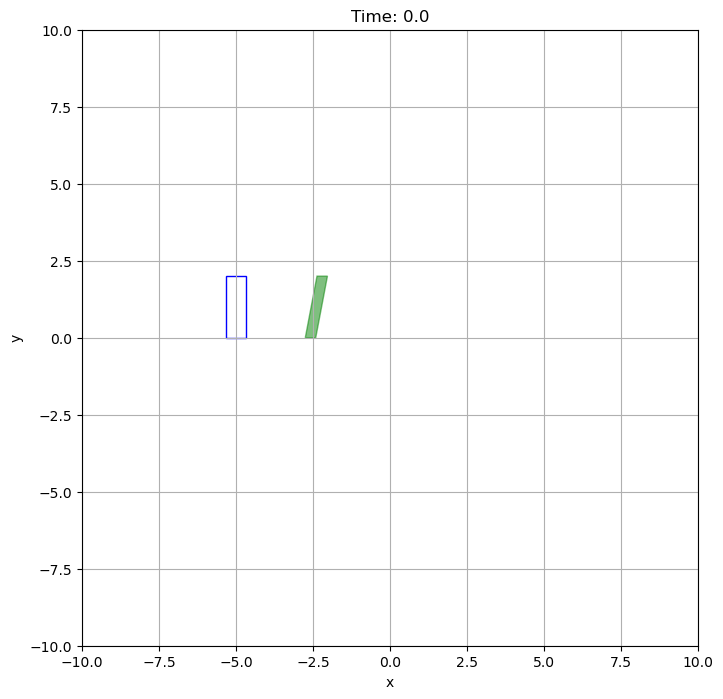

In [94]:
# Constants
c = 1.0  # Speed of light, normalized
v = 0.95  # Velocity of the square
side_length = 2  # Side length of the square
initial_position = np.array([-5, 1])
time_steps = 45
dt = 0.1  # Time step size
tolerance = 0.10  # Tolerance for intersection detection

# Calculate the Lorentz factor
gamma = 1 / np.sqrt(1 - v**2 / c**2)

# Function to create the square's vertices with length contraction
def get_square_vertices(center, side_length, gamma):
    half_side = side_length / 2
    contracted_half_side = half_side / gamma
    return np.array([
        (center[0] - contracted_half_side, center[1] - half_side),
        (center[0] + contracted_half_side, center[1] - half_side),
        (center[0] + contracted_half_side, center[1] + half_side),
        (center[0] - contracted_half_side, center[1] + half_side)
    ])

# Function to detect intersection and create new moving points
def detect_intersections_and_create_points(vertices, circle_center, circle_radius, points_created):
    new_points = []
    
    for vertex in vertices:
        # Calculate the distance from the circle center to the vertex
        distance_to_circle_center = np.linalg.norm(vertex - circle_center)
        # Check if the vertex is on the circle
        if abs(distance_to_circle_center - circle_radius) < tolerance and tuple(vertex) not in points_created:
            new_points.append(vertex)
            points_created.add(tuple(vertex))
            
    return new_points, points_created

# Create a function to update the plot for each frame in the animation
def update_frame(frame, ax, circle_center, initial_position, v, side_length, gamma, points_created):
    ax.clear()
    
    # Update square position
    square_center = initial_position + np.array([v * frame * dt, 0])
    square_vertices = get_square_vertices(square_center, side_length, gamma)
    square = Polygon(square_vertices, closed=True, fill=False, edgecolor='b')
    ax.add_patch(square)

    # Update circle
    circle_radius = frame * dt
    circle = Circle(circle_center, circle_radius, fill=False, edgecolor='r')
    ax.add_patch(circle)

    # Detect intersections and create new moving points
    new_points, points_created = detect_intersections_and_create_points(square_vertices, circle_center, circle_radius, points_created)
    
    # Update the positions of already created points
    if len(points_created) == len(square_vertices):
        points_list = np.array(list(points_created))
        hull = ConvexHull(points_list)
        hull_vertices = points_list[hull.vertices]
        green_polygon = Polygon(hull_vertices, closed=True, fill=True, edgecolor='g', facecolor='green', alpha=0.5)
        ax.add_patch(green_polygon)
    else:
        for point in points_created:
            updated_point = np.array(point) + 0
            ax.plot(*updated_point, 'go')

    # Stop the animation when all vertices have been intersected
    if len(points_created) == len(square_vertices):
        ani.event_source.stop()

    ax.set_xlim(-10, 10)
    ax.set_ylim(-10, 10)
    ax.set_aspect('equal', 'box')
    ax.grid(True)
    ax.set_title(f'Time: {frame * dt:.1f}')
    ax.set_xlabel('x')
    ax.set_ylabel('y')

# Set up the figure for animation
fig, ax = plt.subplots(figsize=(8, 8))
circle_center = (0, 0)
points_created = set()

# Create an animation object
ani = animation.FuncAnimation(
    fig, update_frame, frames=time_steps, fargs=(ax, circle_center, initial_position, v, side_length, gamma, points_created), repeat=False
)

# Display the animation using HTML
HTML(ani.to_jshtml())


### 1 Analytical solution found on the internet

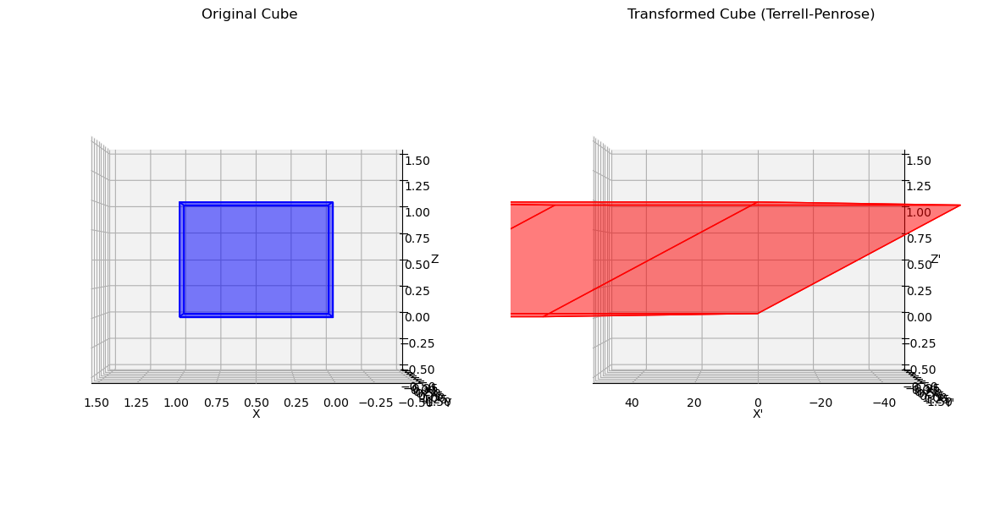

In [90]:
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

# Define the speed of light in natural units
c = 1

def gamma(v):
    """Calculate the Lorentz factor."""
    return 1 / np.sqrt(1 - (v/c)**2)

def terrell_penrose_transform(vertices, velocity, d):
    """Apply the Terrell-Penrose effect transformation."""
    G = gamma(velocity)
    transformed_vertices = []

    for x, y, z in vertices:
        # Calculate the apparent coordinates
        x_prime = G * (x + (velocity/c) * (x**2 + y**2 + (z-d)**2 - d))
        y_prime = y
        z_prime = z
        transformed_vertices.append([x_prime, y_prime, z_prime])

    return np.array(transformed_vertices)

def inverse_terrell_penrose_transform(transformed_vertices, velocity, d):
    """Apply the inverse Terrell-Penrose effect transformation."""
    G = gamma(velocity)
    original_vertices = []

    for x_prime, y_prime, z_prime in transformed_vertices:
        # Calculate the original coordinates
        term = (velocity/c) * G * d
        root_term = np.sqrt((x_prime + term)**2 + y_prime**2 + (z_prime - d)**2)
        x = G * (x_prime + term - (velocity/c) * root_term)
        y = y_prime
        z = z_prime
        original_vertices.append([x, y, z])

    return np.array(original_vertices)

def plot_cube(vertices, ax, color='b', alpha=0.3):
    """Plots a cube given its vertices."""
    # Define the 12 edges of the cube
    edges = [
        [vertices[j] for j in [0, 1, 2, 3]],
        [vertices[j] for j in [4, 5, 6, 7]],
        [vertices[j] for j in [0, 1, 5, 4]],
        [vertices[j] for j in [2, 3, 7, 6]],
        [vertices[j] for j in [1, 2, 6, 5]],
        [vertices[j] for j in [4, 7, 3, 0]]
    ]
    ax.add_collection3d(Poly3DCollection(edges, color=color, alpha=alpha))

# Define the cube's vertices in the original frame
original_vertices = np.array([
    [0, 0, 0],
    [1, 0, 0],
    [1, 1, 0],
    [0, 1, 0],
    [0, 0, 1],
    [1, 0, 1],
    [1, 1, 1],
    [0, 1, 1]
])

# Velocity of the moving frame
velocity = 0.9999* c  # 80% the speed of light
d = 5# Distance of the observer from the object

# Transform the cube's vertices using the Terrell-Penrose transformation
transformed_vertices = terrell_penrose_transform(original_vertices, velocity, d)
# Plotting the original and transformed cubes
fig = plt.figure(figsize=(12, 6))

# Original cube
ax1 = fig.add_subplot(121, projection='3d')
plot_cube(original_vertices, ax1, color='b', alpha=0.3)
ax1.set_title('Original Cube')
ax1.set_xlabel('X')
ax1.set_ylabel('Y')
ax1.set_zlabel('Z')
ax1.set_xlim([-0.5, 1.5])
ax1.set_ylim([-0.5, 1.5])
ax1.set_zlim([-0.5, 1.5])
ax1.view_init(elev=0, azim=90)  # Look along the x-axis

# Transformed cube
ax2 = fig.add_subplot(122, projection='3d')
plot_cube(transformed_vertices, ax2, color='r', alpha=0.3)
ax2.set_title('Transformed Cube (Terrell-Penrose)')
ax2.set_xlabel("X'")
ax2.set_ylabel("Y'")
ax2.set_zlabel("Z'")
ax2.set_xlim([-50.5, 50.5])
ax2.set_ylim([-0.5, 1.5])
ax2.set_zlim([-0.5, 1.5])
ax2.view_init(elev=0, azim=90)  # Look along the x-axis

plt.tight_layout()
plt.show()

### 2nd analytical solution found on the internet

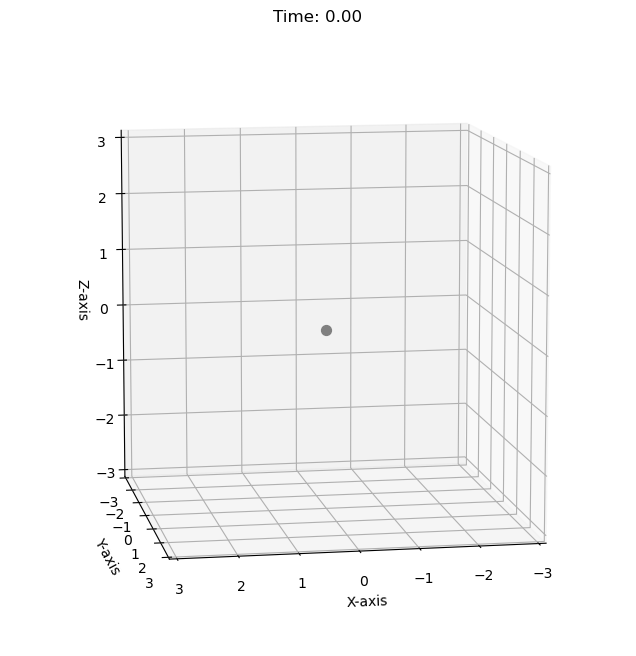

In [112]:
# Constants
c = 1.0  # Speed of light, normalized
v = 0.9 # Velocity of the cube
time_steps = 60
dt = 0.1  # Time step size
observer_pos = np.array([0, 0, 0])  # Observer position at the origin

def kdelta(a, b):
    """Kronecker delta"""
    return 1 if a == b else 0

def lorentz_matrix(beta):
    """
    Generate Lorentz transformation matrix depending on beta.
    
    Args:
        beta: Scaled velocity beta = v/c where c is the speed of light.
        
    Return:
        Lorentz-Transformation matrix
    """
    gamma = 1 / np.sqrt(1 - np.dot(beta, beta))
    Lambda = np.identity(4)
    Lambda[0, 0] = gamma
    for i in range(1, 4):
        Lambda[0, i] = -gamma * beta[i - 1]
        Lambda[i, 0] = -gamma * beta[i - 1]
        for j in range(1, 4):
            Lambda[i, j] = kdelta(i, j) + gamma**2 / (gamma + 1) * beta[i - 1] * beta[j - 1]
    return Lambda

def create_cube(center, size):
    """Create the vertices of a cube given its center and size."""
    half_size = size / 2
    return np.array([[center[0] - half_size, center[1] - half_size, center[2] - half_size],
                     [center[0] + half_size, center[1] - half_size, center[2] - half_size],
                     [center[0] + half_size, center[1] + half_size, center[2] - half_size],
                     [center[0] - half_size, center[1] + half_size, center[2] - half_size],
                     [center[0] - half_size, center[1] - half_size, center[2] + half_size],
                     [center[0] + half_size, center[1] - half_size, center[2] + half_size],
                     [center[0] + half_size, center[1] + half_size, center[2] + half_size],
                     [center[0] - half_size, center[1] + half_size, center[2] + half_size]])

def transform_vertices(vertices, beta, obs_time, observer_pos):
    """Transform cube vertices using Lorentz transformation."""
    L = lorentz_matrix(beta)
    invL = np.linalg.inv(L)
    
    transformed_vertices = []
    obs2 = L.dot(np.array([obs_time, *observer_pos]))

    for vertex in vertices:
        dx = vertex - obs2[1:]
        delta = np.sqrt(dx.dot(dx))
        tp2 = obs2[0] - delta
        obj2 = np.append([tp2], vertex)
        obj1 = invL.dot(obj2)
        transformed_vertices.append(obj1[1:])
    
    return np.array(transformed_vertices)

# Create a 3D plot for the animation
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlim([-3, 3])
ax.set_ylim([-3, 3])
ax.set_zlim([-3, 3])
ax.set_box_aspect([1, 1, 1])  # aspect ratio is 1:1:1
ax.grid(True)

# Set the view angle to view from the x-axis
ax.view_init(elev=10, azim=80)

# Create a cube
cube_size = 1
cube_center = np.array([-2, -2, 0])  # Starting position of the cube
cube_vertices = create_cube(cube_center, cube_size)

# Define velocity as a fraction of the speed of light
beta = np.array([v, 0, 0]) / c

# Animation function
def update_frame(frame):
    ax.cla()  # Clear the previous frame
    ax.set_xlim([-3, 3])
    ax.set_ylim([-3, 3])
    ax.set_zlim([-3, 3])
    ax.set_box_aspect([1, 1, 1])  # aspect ratio is 1:1:1
    ax.grid(True)
    
    # Update the observation time
    obs_time = frame * dt
    
    # Transform the cube vertices
    transformed_vertices = transform_vertices(cube_vertices, beta, obs_time, observer_pos)

    # Create the cube polygons
    faces = [[transformed_vertices[j] for j in [0, 1, 2, 3]],  # bottom face
             [transformed_vertices[j] for j in [4, 5, 6, 7]],  # top face
             [transformed_vertices[j] for j in [0, 1, 5, 4]],  # front face
             [transformed_vertices[j] for j in [2, 3, 7, 6]],  # back face
             [transformed_vertices[j] for j in [0, 3, 7, 4]],  # left face
             [transformed_vertices[j] for j in [1, 2, 6, 5]]]  # right face
    
    # Create a 3D polygon collection for the cube faces
    ax.add_collection3d(Poly3DCollection(faces, facecolors='cyan', linewidths=1, edgecolors='r', alpha=.25))

    # Plot observer position
    ax.scatter(*observer_pos, color='grey', s=50, label='Observer', marker='o')

    # Set title and labels
    ax.set_title(f'Time: {obs_time:.2f}')
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Y-axis')
    ax.set_zlabel('Z-axis')

# Create an animation object
ani = animation.FuncAnimation(fig, update_frame, frames=time_steps, repeat=False)

# Display the animation using HTML
HTML(ani.to_jshtml())

#### Try with sphere

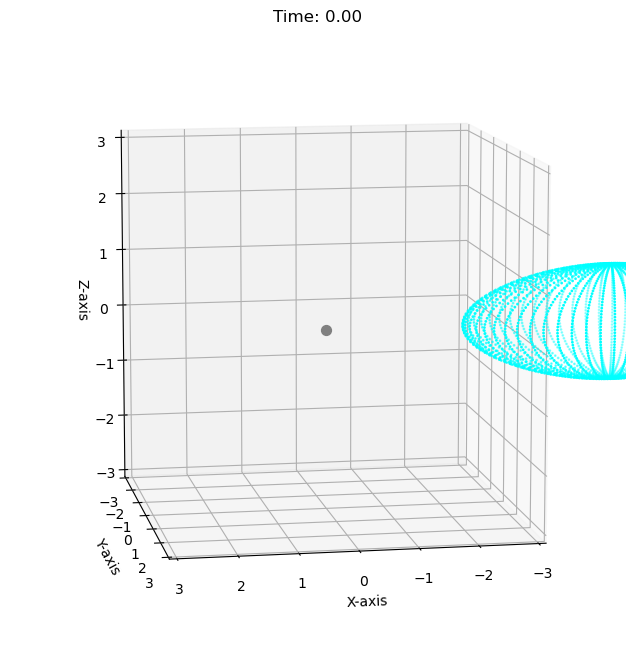

In [115]:
# Constants
c = 1.0  # Speed of light, normalized
v = 0.7  # Velocity of the sphere
observer_pos = np.array([0, 0, 0])  # Position of the observer
time_steps = 35
dt = 0.2  # Time step size

# Kronecker delta function
def kdelta(a, b):
    return 1 if a == b else 0

# Lorentz transformation matrix
def lorentz_matrix(beta):
    gamma = 1 / np.sqrt(1 - np.dot(beta, beta))
    Lambda = np.identity(4)
    Lambda[0, 0] = gamma
    for i in range(1, 4):
        Lambda[0, i] = -gamma * beta[i - 1]
        Lambda[i, 0] = -gamma * beta[i - 1]
        for j in range(1, 4):
            Lambda[i, j] = kdelta(i, j) + gamma**2 / (gamma + 1) * beta[i - 1] * beta[j - 1]
    return Lambda

# Create a sphere
def create_sphere(center, radius, num_points=60):
    points = []
    phi = np.linspace(0, np.pi, num_points)
    theta = np.linspace(0, 2 * np.pi, num_points)
    phi, theta = np.meshgrid(phi, theta)
    x = center[0] + radius * np.sin(phi) * np.cos(theta)
    y = center[1] + radius * np.sin(phi) * np.sin(theta)
    z = center[2] + radius * np.cos(phi)
    for i in range(num_points):
        for j in range(num_points):
            points.append([x[i, j], y[i, j], z[i, j]])
    return np.array(points)

# Transform sphere vertices using Lorentz transformation
def transform_vertices(vertices, beta, obs_time, observer_pos):
    L = lorentz_matrix(beta)
    invL = np.linalg.inv(L)
    
    transformed_vertices = []
    obs2 = L.dot(np.array([obs_time, *observer_pos]))

    for vertex in vertices:
        dx = vertex - obs2[1:]
        delta = np.sqrt(dx.dot(dx))
        tp2 = obs2[0] - delta
        obj2 = np.append([tp2], vertex)
        obj1 = invL.dot(obj2)
        transformed_vertices.append(obj1[1:])
    
    return np.array(transformed_vertices)

# Create a 3D plot for the animation
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlim([-3, 3])
ax.set_ylim([-3, 3])
ax.set_zlim([-3, 3])
ax.set_box_aspect([1, 1, 1])  # aspect ratio is 1:1:1
ax.grid(True)

# Set the view angle to view from the x-axis
ax.view_init(elev=10, azim=80)

# Create a sphere
sphere_radius = 1
sphere_center = np.array([-2, 0, 0])  # Starting position of the sphere
sphere_vertices = create_sphere(sphere_center, sphere_radius)

# Define velocity as a fraction of the speed of light
beta = np.array([v, 0, 0]) / c

# Animation function
def update_frame(frame):
    ax.cla()  # Clear the previous frame
    ax.set_xlim([-3, 3])
    ax.set_ylim([-3, 3])
    ax.set_zlim([-3, 3])
    ax.set_box_aspect([1, 1, 1])  # aspect ratio is 1:1:1
    ax.grid(True)
    
    # Update the observation time
    obs_time = frame * dt
    
    # Transform the sphere vertices
    transformed_vertices = transform_vertices(sphere_vertices, beta, obs_time, observer_pos)

    # Plot the transformed sphere vertices
    ax.scatter(transformed_vertices[:, 0], transformed_vertices[:, 1], transformed_vertices[:, 2], color='cyan', s=1)

    # Plot observer position
    ax.scatter(*observer_pos, color='grey', s=50, label='Observer', marker='o')

    # Set title and labels
    ax.set_title(f'Time: {obs_time:.2f}')
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Y-axis')
    ax.set_zlabel('Z-axis')

# Create an animation object
ani = animation.FuncAnimation(fig, update_frame, frames=time_steps, repeat=False)

# Display the animation using HTML
HTML(ani.to_jshtml())

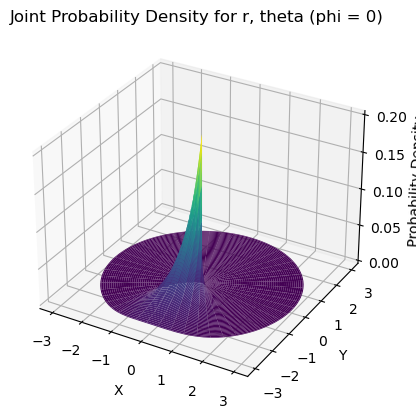

In [ ]:
# Define parameters
lambda_r = 1.0
sigma_theta = np.pi/10

# Define the joint probability distribution
def F_r_theta_phi(r, theta, phi):
    P_r = lambda_r * np.exp(-lambda_r * r)
    P_theta_given_r = (1 / (sigma_theta * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((theta - np.pi) / sigma_theta)**2)
    P_phi_given_r_theta = 1 / (2 * np.pi)
    return P_r * P_theta_given_r * P_phi_given_r_theta

# Generate a grid of points
r = np.linspace(0, 3, 100)
theta = np.linspace(0, 2 * np.pi, 100)
phi = np.linspace(0, 2 * np.pi, 100)
R, Theta, Phi = np.meshgrid(r, theta, phi)

# Compute the joint probability density at each point
F = F_r_theta_phi(R, Theta, Phi)

# Visualize the marginal distribution P(r, theta) for a fixed phi (e.g., phi = 0)
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
Theta_fixed = Theta[:, :, 0]
R_fixed = R[:, :, 0]
F_fixed = F[:, :, 0]

ax.plot_surface(R_fixed * np.sin(Theta_fixed), R_fixed * np.cos(Theta_fixed), F_fixed, cmap='viridis')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Probability Density')
ax.set_title('Joint Probability Density for r, theta (phi = 0)')
plt.show()

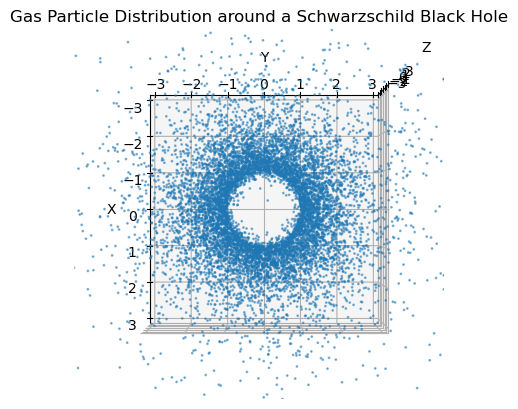

In [199]:

# Define parameters
lambda_r = 1.0
sigma_theta = np.pi / 10
Rs = 1.0  # Schwarzschild radius

# Define the joint probability distribution
def F_r_theta_phi(r, theta, phi):
    P_r = lambda_r * np.exp(-lambda_r * (r - R_s)) * (r > R_s)
    P_theta_given_r = (1 / (sigma_theta * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((theta - np.pi) / sigma_theta)**2)
    P_phi_given_r_theta = 1 / (2 * np.pi)
    return P_r * P_theta_given_r * P_phi_given_r_theta

# Function to sample from the joint probability distribution
def sample_from_distribution(num_samples):
    # Sample r from exponential distribution and shift by R_s
    r_samples = np.random.exponential(scale=1/lambda_r, size=num_samples) + Rs
    
    # Sample theta from normal distribution centered at pi
    theta_samples = np.random.normal(loc=np.pi/2, scale=sigma_theta, size=num_samples)
    
    # Sample phi from uniform distribution
    phi_samples = np.random.uniform(low=0, high=2*np.pi, size=num_samples)
    
    return r_samples, theta_samples, phi_samples

# Number of samples
num_samples = 10000

# Generate samples
R_samples, theta_samples, phi_samples = sample_from_distribution(num_samples)

# Convert to Cartesian coordinates for visualization
x_samples = R_samples * np.sin(theta_samples) * np.cos(phi_samples)
y_samples = R_samples * np.sin(theta_samples) * np.sin(phi_samples)
z_samples = R_samples * np.cos(theta_samples)

# Example visualization in 3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x_samples, y_samples, z_samples, s=1, alpha=0.5)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Gas Particle Distribution around a Schwarzschild Black Hole')
ax.set_xlim([-3, 3])
ax.set_ylim([-3, 3])
ax.set_zlim([-3, 3])
ax.view_init(elev=90, azim=0)
plt.show()
